# Now i'm going to use logisstic regression for purchase prabobility and price elasticity for it, and linear regression for quantity model 

## Libraries

In [2]:
#importing libraries
import numpy as np
import pandas as pd

# import the sk learn modules, need to segment our new dat, scaler, pca and k-means.
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# import pickle in order to be able to load our pickled objects.
import pickle

# import the Logistic Regression module from sk learn for the purchase probability model.
from sklearn.linear_model import LogisticRegression 

# import the necessary libraries for visualization, seaborn do be our default.
import matplotlib.pyplot as plt
import matplotlib.axes as axs
import seaborn as sns
sns.set()

# import the Linear Regression module from sk learn for the quantity model.
from sklearn.linear_model import LinearRegression

#import warning Ignorance 
import warnings
warnings.filterwarnings('ignore')

# to now cutting the rows by default
# pd.options.display.max_rows = None

## Data Preparation

In [3]:
#load data
df_purchase = pd.read_csv('data/purchase data.csv')

# Import Scaler
scaler = pickle.load(open('scaler.pickle', 'rb'))

# Import PCA
pca = pickle.load(open('pca.pickle', 'rb'))

# Import K-Means
kmeans_pca = pickle.load(open('kmeans_pca.pickle', 'rb'))

# Standardization
features = df_purchase[['Sex', 'Marital status', 'Age', 'Education', 'Income', 'Occupation', 'Settlement size']]
df_purchase_segm_std = scaler.transform(features)

# Apply PCA
df_purchase_segm_pca = pca.transform(df_purchase_segm_std)

# Segment data
purchase_segm_kmeans_pca = kmeans_pca.predict(df_purchase_segm_pca)

# Create a copy of the data frame
df_purchase_predictors = df_purchase.copy()

# Add segment labels
df_purchase_predictors['Segment'] = purchase_segm_kmeans_pca
segment_dummies = pd.get_dummies(purchase_segm_kmeans_pca, prefix = 'Segment', prefix_sep = '_')
df_purchase_predictors = pd.concat([df_purchase_predictors, segment_dummies], axis = 1)

df_pa = df_purchase_predictors
df_pa

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
0,200000001,1,0,0,0,0,0,1.59,1.87,2.01,...,47,1,110866,1,0,1,0,1,0,0
1,200000001,11,0,0,0,0,0,1.51,1.89,1.99,...,47,1,110866,1,0,1,0,1,0,0
2,200000001,12,0,0,0,0,0,1.51,1.89,1.99,...,47,1,110866,1,0,1,0,1,0,0
3,200000001,16,0,0,0,0,0,1.52,1.89,1.98,...,47,1,110866,1,0,1,0,1,0,0
4,200000001,18,0,0,0,0,0,1.52,1.89,1.99,...,47,1,110866,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58688,200000500,703,0,0,0,2,1,1.41,1.85,2.01,...,42,1,120946,1,0,1,0,1,0,0
58689,200000500,710,0,0,0,0,0,1.36,1.84,2.09,...,42,1,120946,1,0,1,0,1,0,0
58690,200000500,717,0,0,0,0,0,1.50,1.80,2.14,...,42,1,120946,1,0,1,0,1,0,0
58691,200000500,722,1,2,3,0,0,1.51,1.82,2.09,...,42,1,120946,1,0,1,0,1,0,0


## Purchase Probability Model

Now i'm going to find out if the purchase will happen based on price of the product

In [4]:
# In order to predict I need input and output variables. 
# The Y is Incidence, as I want to predict the purchase probability for our customers
Y = df_pa['Incidence']

In [5]:
# The dependant variable is based on the average price of Lamps. 
# Therefore, X is a data frame, containing the mean across the five prices.
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] +
                   df_pa['Price_2'] +
                   df_pa['Price_3'] +
                   df_pa['Price_4'] +
                   df_pa['Price_5'] ) / 5

In [6]:
# I create a Logistic Regression model using sk learn. Then I fit the model with The X or price and The Y or incidence.
model_purchase = LogisticRegression(solver = 'sag') # sag solver is good for small problems for big datasets
model_purchase.fit(X, Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [7]:
# The coefficients for price. It is negative, signaling that with an increase in price, the purchase probability decreases.
model_purchase.coef_

array([[-2.36437735]])

### Result:
### We can see the coefficiency is negative it means decreasing in price will lead to increasing the purchase prabobility

now after implementing the logistic regression model we can use the result to finde the price elasticity for purchase prabobility

## Price Elasticity of Purchase Probability
#### The real question here is how the demands changes with changing the price

prices for the five different brands, which is an important factor in determining purchase probability. 
It informs the price range, for which i will be exploring purchase probability.

In [8]:
df_pa[['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']].describe()

,Price_1,Price_2,Price_3,Price_4,Price_5
count,58693.000000,58693.000000,58693.000000,58693.000000,58693.000000
mean,1.392074,1.780999,2.006789,2.159945,2.654798
std,0.091139,0.170868,0.046867,0.089825,0.098272
min,1.100000,1.260000,1.870000,1.760000,2.110000
25%,1.340000,1.580000,1.970000,2.120000,2.630000
50%,1.390000,1.880000,2.010000,2.170000,2.670000
75%,1.470000,1.890000,2.060000,2.240000,2.700000
max,1.590000,1.900000,2.140000,2.260000,2.800000


Ok, now we noe the Min Price is: 1.10 CAD, and the max Price is: 2.8 CAD

- Introduce the price range for which i'll examine the purchase probability.
- I choose a price range between 0.5 and 3.49, which somewhat expands the actual observed price range, 
- Which is from 1.1 to 2.8

In [9]:
# generating the price value from 0.5 to 3.5 with step of 1 cent
price_range = np.arange(0.5, 3.5, 0.01)
price_range

array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.  , 1.01, 1.02, 1.03, 1.04,
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49, 1.5 , 1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59,
       1.6 , 1.61, 1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.69, 1.7 ,
       1.71, 1.72, 1.73, 1.74, 1.75, 1.76, 1.77, 1.78, 1.79, 1.8 , 1.81,
       1.82, 1.83, 1.84, 1.85, 1.86, 1.87, 1.88, 1.89, 1.9 , 1.91, 1.92,
       1.93, 1.94, 1.95, 1.96, 1.97, 1.98, 1.99, 2.

Now we have 300 values 

In [10]:
# saving the dataframe
df_price_range = pd.DataFrame(price_range)

predict the purchase probability for newly defined price range. 
The result is a 2x300  array. 

In [11]:
# saving the proba in variable
Y_pr = model_purchase.predict_proba(df_price_range)
Y_pr

array([[0.08232104, 0.91767896],
       [0.08412492, 0.91587508],
       [0.08596463, 0.91403537],
       [0.08784071, 0.91215929],
       [0.08975371, 0.91024629],
       [0.09170419, 0.90829581],
       [0.09369269, 0.90630731],
       [0.09571977, 0.90428023],
       [0.09778597, 0.90221403],
       [0.09989184, 0.90010816],
       [0.10203794, 0.89796206],
       [0.1042248 , 0.8957752 ],
       [0.10645298, 0.89354702],
       [0.10872301, 0.89127699],
       [0.11103543, 0.88896457],
       [0.11339077, 0.88660923],
       [0.11578958, 0.88421042],
       [0.11823236, 0.88176764],
       [0.12071964, 0.87928036],
       [0.12325193, 0.87674807],
       [0.12582974, 0.87417026],
       [0.12845357, 0.87154643],
       [0.1311239 , 0.8688761 ],
       [0.13384122, 0.86615878],
       [0.13660599, 0.86339401],
       [0.13941869, 0.86058131],
       [0.14227975, 0.85772025],
       [0.14518962, 0.85481038],
       [0.14814873, 0.85185127],
       [0.15115748, 0.84884252],
       [0.

- The first column shows the probability for not purchasing the product
- The second the probability for purchase for each price point in our price range.


#### Because i'm interested in purchase prabobility i will use the second column only
###### it means the array will be 300x1 and it shows the prabobility of purchase for each price point
#### saving the result

In [12]:
#saving the result in a variable
purchase_pr = Y_pr[:][:, 1]
purchase_pr

array([0.91767896, 0.91587508, 0.91403537, 0.91215929, 0.91024629,
       0.90829581, 0.90630731, 0.90428023, 0.90221403, 0.90010816,
       0.89796206, 0.8957752 , 0.89354702, 0.89127699, 0.88896457,
       0.88660923, 0.88421042, 0.88176764, 0.87928036, 0.87674807,
       0.87417026, 0.87154643, 0.8688761 , 0.86615878, 0.86339401,
       0.86058131, 0.85772025, 0.85481038, 0.85185127, 0.84884252,
       0.84578373, 0.84267451, 0.8395145 , 0.83630335, 0.83304072,
       0.82972631, 0.82635982, 0.82294097, 0.81946951, 0.81594521,
       0.81236787, 0.80873729, 0.80505332, 0.80131582, 0.79752469,
       0.79367985, 0.78978124, 0.78582885, 0.78182267, 0.77776275,
       0.77364915, 0.76948197, 0.76526136, 0.76098747, 0.75666051,
       0.75228072, 0.74784836, 0.74336376, 0.73882724, 0.73423921,
       0.72960008, 0.7249103 , 0.72017039, 0.71538087, 0.71054232,
       0.70565536, 0.70072064, 0.69573887, 0.69071077, 0.68563712,
       0.68051874, 0.67535649, 0.67015125, 0.66490396, 0.65961

##### we can see the demand for lower prices are more than the high value prices but the real question is:
## How does the demand changes when the price changes.

### Purchase prabobility Elasticity:
#### Delta purchase prabobility divided by price multiply by price divided by delta purchase prabobility
### The Elasticity Formula:
#### Coefficients from the model times Price time 1 minus purchase prabobility
# E = beta * price * (1 - Pr(purchase))

### The elasticity of each data point

In [13]:
# calculating the formula
pe = model_purchase.coef_[:, 0] * price_range * (1 - purchase_pr)
pe

array([-0.097319  , -0.10144056, -0.10569147, -0.11007495, -0.11459429,
       -0.11925282, -0.12405393, -0.12900106, -0.1340977 , -0.13934738,
       -0.14475371, -0.15032032, -0.1560509 , -0.16194919, -0.16801898,
       -0.17426408, -0.18068837, -0.18729576, -0.19409021, -0.20107571,
       -0.20825629, -0.21563602, -0.22321899, -0.23100933, -0.2390112 ,
       -0.24722879, -0.2556663 , -0.26432796, -0.27321801, -0.28234073,
       -0.29170037, -0.30130123, -0.31114759, -0.32124374, -0.33159397,
       -0.34220256, -0.35307379, -0.3642119 , -0.37562114, -0.38730573,
       -0.39926985, -0.41151767, -0.42405332, -0.43688086, -0.45000435,
       -0.46342775, -0.47715501, -0.49118998, -0.50553647, -0.5201982 ,
       -0.53517883, -0.55048192, -0.56611095, -0.58206929, -0.59836024,
       -0.61498696, -0.63195252, -0.64925987, -0.66691182, -0.68491108,
       -0.7032602 , -0.72196159, -0.74101753, -0.76043015, -0.78020139,
       -0.80033308, -0.82082683, -0.84168411, -0.86290622, -0.88

- Create price elasticities master data frame.
- It will contain all the elasticities we calculate during the purchase analytics part of the course.

In [14]:
df_price_elasticities = pd.DataFrame(price_range)
df_price_elasticities

,0
0,0.50
1,0.51
2,0.52
3,0.53
4,0.54
...,...
295,3.45
296,3.46
297,3.47
298,3.48


Lets create a dataframe from our data points and elasticity of each

In [15]:
#changing the columns name
df_price_elasticities = df_price_elasticities.rename(columns = {0: "Price_Point"})

# adding the price elasticity array
df_price_elasticities['Mean_PE'] = pe

# i could use the pd.option.max_rows = None --> to show all rows
df_price_elasticities

,Price_Point,Mean_PE
0,0.50,-0.097319
1,0.51,-0.101441
2,0.52,-0.105691
3,0.53,-0.110075
4,0.54,-0.114594
...,...,...
295,3.45,-8.072953
296,3.46,-8.098305
297,3.47,-8.123624
298,3.48,-8.148909


For each row we have the price and the price elasticity, it will help to determine the average customer purchase behaviour 

Lets plot the result and analyze it

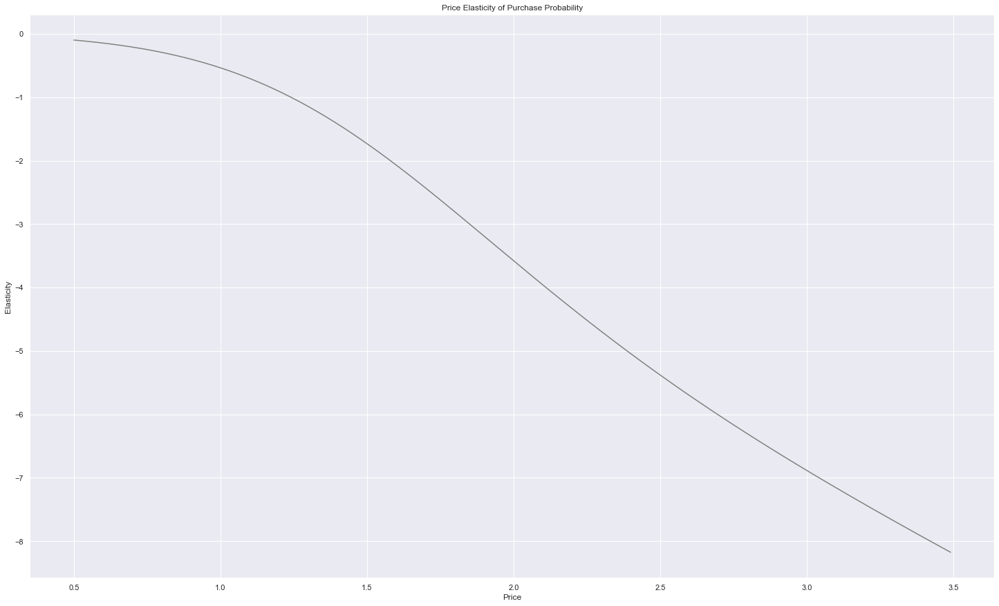

In [16]:
# display the price elasticity of purchase probability of the average customer.
plt.figure(figsize = (25, 15))
plt.plot(price_range, pe, color = 'grey')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')
plt.show()

# Analyzing the Result

#### As it shows the price elasticity decreases when the price increases, it mean when the price goes up it is less likely for people to buy it, the important thing is at what rate it happens, by the plot we can see that the price between 0.5 to 1.1 the elasticity goes down smoothly but after that it very sharp.
#### The other thing to observe is all elasticity numbers are negative and its because we used the model coefficiency which was -2.35 (so the elasticity will be negative)
#### If the elasticity is greater than 1 (more than the 100%) we say that it " ELASTIC" and if not its "INELASTIC", we can check all elasticity related to price by the dataframe we made for it.
### Example:
#### for the price of 1.10 the elasticity is -0.69 (-69%) it is INELASTIC, and it means by increasing the price for 1% the prabobility of purchase will be change by minus 69%
#### for the price 1.50 the elasticity is -1.7 (-179%) it is Elastic it means by the increase of 1% of the price the prabobility will change 2%.


# General Recommendations:

## For inelastic values we have to increase the price and its because we would not have Significant decrease in out put, and for elastic values we should decrease the price.

### The border of elasticity and inelasticity in our case is 1.25 and it means we can increase prices for all values before that and decrease for after that.

# Purchase Probability by Segments

### Career-Focused

In [17]:
# Filter the data to contain only customers from segment 1, the career-focused.
df_pa_segment_1 = df_pa[df_pa['Segment'] == 1]

In [18]:
# Again we want to predict the purchase probability, so our Y variable is the incidence column.
# Only here we select only the customers from the first segment.
Y = df_pa_segment_1['Incidence']

In [19]:
X = pd.DataFrame()

In [20]:
# We calculate the average price for purchases in segment 1.
# Our dependant variable contains the mean price of the brands.
X['Mean_Price'] = (df_pa_segment_1['Price_1'] + 
                   df_pa_segment_1['Price_2'] + 
                   df_pa_segment_1['Price_3'] + 
                   df_pa_segment_1['Price_4'] + 
                   df_pa_segment_1['Price_5']) / 5

In [21]:
# Fit logistic regression model
model_incidence_segment_1 = LogisticRegression(solver = 'sag')
model_incidence_segment_1.fit(X, Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

In [22]:
# We observe that the price coefficient for the career focused is -1.7, whereas for the average customer it was -2.35.
# This is an indicator, that this segment is higher price sensitive compared to the average customer.
model_incidence_segment_1.coef_

array([[-3.63253157]])

In [23]:
# Calculate Price Elasticity of the career-focused segment.
Y_segment_1 = model_incidence_segment_1.predict_proba(df_price_range)
purchase_pr_segment_1 = Y_segment_1[:][:, 1]
pe_segment_1 = model_incidence_segment_1.coef_[:, 0] * price_range * (1 - purchase_pr_segment_1)

### Results

In [24]:
df_price_elasticities['Carrier-Focused'] = pe_segment_1
df_price_elasticities

,Price_Point,Mean_PE,Carrier-Focused
0,0.50,-0.097319,-0.031619
1,0.51,-0.101441,-0.033423
2,0.52,-0.105691,-0.035315
3,0.53,-0.110075,-0.037300
4,0.54,-0.114594,-0.039382
...,...,...,...
295,3.45,-8.072953,-12.516559
296,3.46,-8.098305,-12.553399
297,3.47,-8.123624,-12.590222
298,3.48,-8.148909,-12.627029


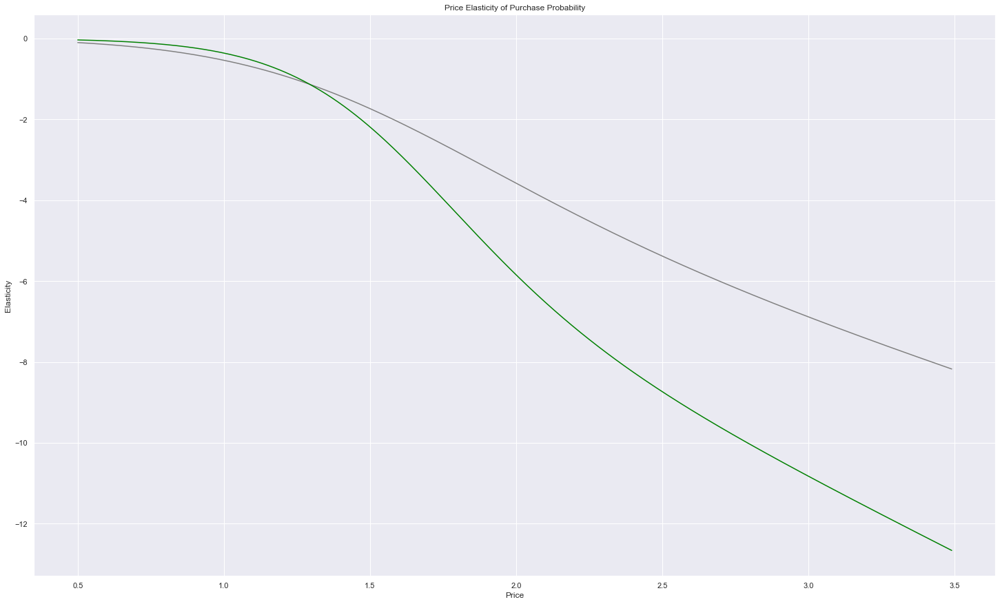

In [25]:
# We plot the elasticities of the average customer and the career-focused segment side by side. 
# The career-focused segment is displayed in green. The same color we used during the descriptive analysis.
plt.figure(figsize = (25, 15))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')
plt.show()

### $\color{red}{\text{}}$

### Fewer-Opportunities

In [26]:
# Select only customers from segment 2, the fewer-opportunities.
df_pa_segment_2 = df_pa[df_pa['Segment'] == 2]
# Logistic regression model
Y = df_pa_segment_2['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_2['Price_1'] + 
                   df_pa_segment_2['Price_2'] + 
                   df_pa_segment_2['Price_3'] + 
                   df_pa_segment_2['Price_4'] + 
                   df_pa_segment_2['Price_5']) / 5

model_incidence_segment2 = LogisticRegression(solver = 'sag')
model_incidence_segment2.fit(X, Y)

# Calculate price elasticities
model_incidence_segment2.coef_
Y_segment_2 = model_incidence_segment2.predict_proba(df_price_range)
purchase_pr_segment2 = Y_segment_2[:][: , 1]
pe_segment2 = model_incidence_segment2.coef_[:,0] * price_range * ( 1- purchase_pr_segment2)

### Results

In [27]:
df_price_elasticities['Fewer-Opportunities'] = pe_segment2

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

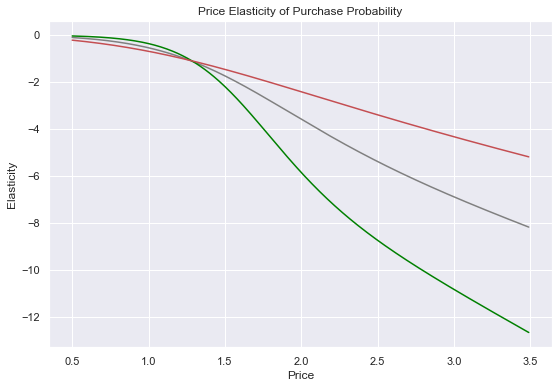

In [28]:
plt.figure(figsize = (9, 6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment2, color = 'r')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

### Standard

In [29]:
# Select only customers from segment 0, the standard segment.
df_pa_segment_0 = df_pa[df_pa['Segment'] == 0]
# Prepare dependant and independant variables.
Y = df_pa_segment_0['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_0['Price_1'] + 
                   df_pa_segment_0['Price_2'] + 
                   df_pa_segment_0['Price_3'] + 
                   df_pa_segment_0['Price_4'] + 
                   df_pa_segment_0['Price_5']) / 5
# Logistic regression model
model_incidence_segment0 = LogisticRegression(solver = 'sag')
model_incidence_segment0.fit(X, Y)

model_incidence_segment0.coef_
Y_segment_0 = model_incidence_segment0.predict_proba(df_price_range)
purchase_pr_segment0 = Y_segment_0[:][: , 1]
pe_segment0 = model_incidence_segment0.coef_[:,0] * price_range *( 1- purchase_pr_segment0)
df_price_elasticities.insert(2, column = 'Standard', value = pe_segment0)

# Well-Off

In [30]:
# Select only customers from segment 3 
df_pa_segment_3 = df_pa[df_pa['Segment'] == 3]
# Prepare dependant and independant variables.
Y = df_pa_segment_3['Incidence']

X = pd.DataFrame()
# Calculate average price for this segment
X['Mean_Price'] = (df_pa_segment_3['Price_1'] + 
                   df_pa_segment_3['Price_2'] + 
                   df_pa_segment_3['Price_3'] + 
                   df_pa_segment_3['Price_4'] + 
                   df_pa_segment_3['Price_5']) / 5
# Logistic regression model
model_incidence_segment3 = LogisticRegression(solver = 'sag')
model_incidence_segment3.fit(X, Y)

model_incidence_segment3.coef_
Y_segment_3 = model_incidence_segment3.predict_proba(df_price_range)
purchase_pr_segment3 = Y_segment_3[:][: , 1]
pe_segment3 = model_incidence_segment3.coef_[:,0] * price_range *( 1- purchase_pr_segment3)
df_price_elasticities['Well-Off'] = pe_segment3
df_price_elasticities.head()

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383


Lets plot all results together

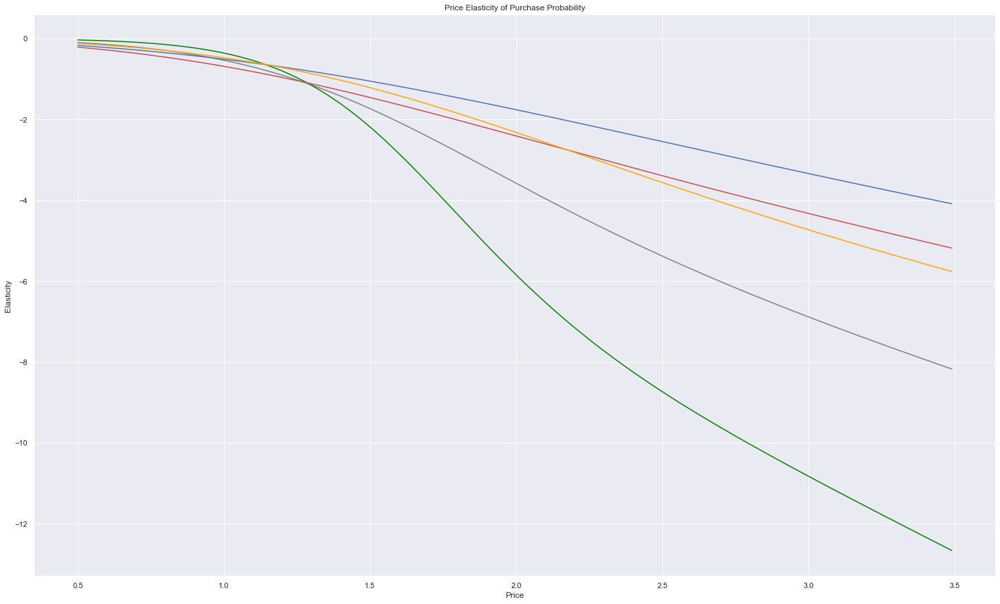

In [31]:
#ploting all elasticities together
plt.figure(figsize = (25, 15))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment0, color = 'b')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment2, color = 'r')
plt.plot(price_range, pe_segment3, color = 'orange')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')
plt.show()

# Results

#### By display all elasticities of purchase probability on the same plot. 

#### the observe that the Career-focused segment are the least elastic when compared to the rest.  So, their purchase probability elasticity is not as affected by price.

#### The price elasticities for the Standard segment seem to differ across price range. This may be due to the fact that, the standard segment is least homogenous, which we discovered during our descriptive analysis. It may be that the customers in this segment have different shopping habbits, which is why their customers start with being more elastic than average but then shift to being more inelastic than the average customer and indeed the Career-focused segment.

### One of the most important thing that has impact on the purchase is promotions
### Lets to see how it would impact on out customers.


## Purchase Probability with Promotion Feature

### Data Preparation

Now I'm going to include a second promotion feature. We'd like to examine the effects of promotions on purchase probability.

In [32]:
Y = df_pa['Incidence']

In [33]:
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] + 
                   df_pa['Price_2'] + 
                   df_pa['Price_3'] + 
                   df_pa['Price_4'] + 
                   df_pa['Price_5']) / 5

In [34]:
# add the mean price for the brands
X['Mean_Promotion'] = (df_pa['Promotion_1'] +
                       df_pa['Promotion_2'] +
                       df_pa['Promotion_3'] +
                       df_pa['Promotion_4'] +
                       df_pa['Promotion_5'] ) / 5
X.head()

,Mean_Price,Mean_Promotion
0,2.044,0.2
1,2.028,0.0
2,2.028,0.0
3,2.028,0.0
4,2.030,0.0


## Model Estimation

In [35]:
# fitting the model
model_incidence_promotion = LogisticRegression(solver = 'sag')
model_incidence_promotion.fit(X, Y)
model_incidence_promotion.coef_

array([[-1.49382785,  0.56153992]])

# Result
##### The coefficient for promotion is positive, Therefore, there is a positive relationship between promotion and purchase probability. it means if the promotion increases the probobility of purchase will increase


## Price Elasticity with Promotion

##### creating a data frame on which our model will predict. We need to include A price and promotion feature.
##### First, we'll include the price range as the price feature. Next, we'll include the promotion feature.

In [36]:
# new price range
df_price_elasticity_promotion = pd.DataFrame(price_range)
df_price_elasticity_promotion = df_price_elasticity_promotion.rename(columns = {0: "Price_Range"})

calculating price elasticities of purchase probability when we assume there is a promotion across at each price points.
Lets assume that all brand has the promotion

In [37]:
# adding a new column with elasticity of promotion equal to 1
df_price_elasticity_promotion['Promotion'] = 1

In [38]:
# Purchase Probability with Promotion Model Prediction
Y_promotion = model_incidence_promotion.predict_proba(df_price_elasticity_promotion)

In [39]:
# Calculating the Elasticities by the formula
promo = Y_promotion[:, 1]
price_elasticity_promo = (model_incidence_promotion.coef_[:, 0] * price_range) * (1 - promo)

In [40]:
# Update master data to include elasticities of purchase probability with promotion feature
df_price_elasticities['Elasticity_with_Promotion'] = price_elasticity_promo
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669
...,...,...,...,...,...,...,...
295,3.45,-8.072953,-4.024243,-12.516559,-5.113265,-5.680113,-4.860850
296,3.46,-8.098305,-4.039114,-12.553399,-5.130290,-5.700269,-4.879050
297,3.47,-8.123624,-4.053970,-12.590222,-5.147297,-5.720387,-4.897220
298,3.48,-8.148909,-4.068809,-12.627029,-5.164285,-5.740470,-4.915359


Now lets see the elsaticity without promotions

## Price Elasticity without Promotion

#####  Assume there aren't any promotional activities on any of the price points, and examine the elasticity of purchase probability when there isn't promotion.

In [41]:
# new price range
df_price_elasticity_promotion_no = pd.DataFrame(price_range)
df_price_elasticity_promotion_no = df_price_elasticity_promotion_no.rename(columns = {0: "Price_Range"})

In [42]:
# adding a new column with elasticity of NO-Promotion equal to 0 
df_price_elasticity_promotion_no['Promotion'] = 0

In [43]:
#Purchase Probability without Promotion Model Prediction
Y_no_promo = model_incidence_promotion.predict_proba(df_price_elasticity_promotion_no)

In [44]:
# Calculating the Elasticities by the formula
no_promo = Y_no_promo[: , 1]
price_elasticity_no_promo = model_incidence_promotion.coef_[:, 0] * price_range *(1- no_promo)

In [45]:
# Update master data frame to include purchase probability elasticities without promotion.
df_price_elasticities['Elasticity_without_Promotion'] = price_elasticity_no_promo
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion,Elasticity_without_Promotion
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728,-0.195639
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844,-0.201759
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039,-0.207983
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313,-0.214309
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669,-0.220740
...,...,...,...,...,...,...,...,...
295,3.45,-8.072953,-4.024243,-12.516559,-5.113265,-5.680113,-4.860850,-4.982501
296,3.46,-8.098305,-4.039114,-12.553399,-5.130290,-5.700269,-4.879050,-4.999406
297,3.47,-8.123624,-4.053970,-12.590222,-5.147297,-5.720387,-4.897220,-5.016290
298,3.48,-8.148909,-4.068809,-12.627029,-5.164285,-5.740470,-4.915359,-5.033155


#### We can now see the values with and without promotion and compare them for each price point in our price range.

Lets plot the results;
 Purchase elasticities with and without promotion side by side to compaire.

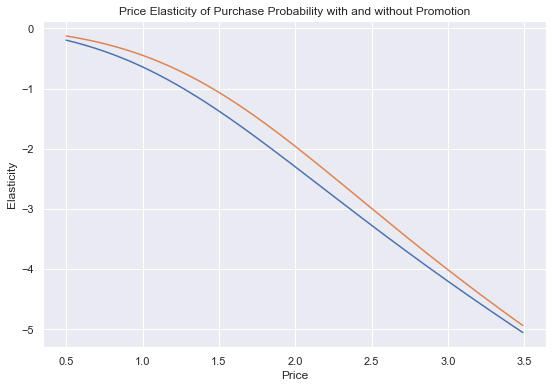

In [46]:
# Ploting the elasticity with and without promotions
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_no_promo)
plt.plot(price_range, price_elasticity_promo)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability with and without Promotion')
plt.show()

# Result
##### Here we observe that the purchase probability elasticity of the customer is less elastic when there is promotion.
##### This is an important insight for marketers, as according to this model people are more likely to buy a product if there is some promotional activity rather than purchase a product with the same price, when it isn't on promotion. 

### Other purchase behaviour outcome is Brands, for this model I'm going to use MULTINOMINAL LOGISTIC REGRETION (for more than one class) due to 5 brands that we have in th datset.

## Brand Choice

### Data Preparation

####  I'm interested in determining the brand choice of the customer.

In [47]:
# filter the data, to include only purchase occasion, when a purchase has occured. 
brand_choice = df_pa[df_pa['Incidence'] == 1]
brand_choice

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,1,0,1,0,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,1,0,1,0,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,1,0,1,0,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,1,0,1,0,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58621,200000500,296,1,2,6,0,0,1.48,1.89,2.01,...,42,1,120946,1,0,1,0,1,0,0
58648,200000500,460,1,1,12,0,0,1.35,1.57,2.02,...,42,1,120946,1,0,1,0,1,0,0
58674,200000500,641,1,2,7,0,0,1.50,1.85,2.06,...,42,1,120946,1,0,1,0,1,0,0
58687,200000500,697,1,2,6,0,0,1.42,1.51,1.97,...,42,1,120946,1,0,1,0,1,0,0


In [48]:
# the model will predict the brand.
Y = brand_choice['Brand']

In [49]:
# which features to include for prediction.
brand_choice.columns.values

array(['ID', 'Day', 'Incidence', 'Brand', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3'], dtype=object)

In [50]:
# predict based on the prices for the five brands.
features = ['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']
X = brand_choice[features]

In [51]:
# Brand Choice Model fit.
model_brand_choice = LogisticRegression(solver = 'sag', multi_class = 'multinomial')
model_brand_choice.fit(X, Y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=None, solver='sag', tol=0.0001, verbose=0,
                   warm_start=False)

We have five brands and five features for the price,  Therefore, this output is somewhat difficult to read.

In [52]:
# the coeffictients for the model
model_brand_choice.coef_

array([[-3.91596106,  0.65845646,  2.41770413,  0.70408095, -0.20211361],
       [ 1.27461272, -1.87985593, -0.21264467, -0.20634164,  0.58787068],
       [ 1.62419119,  0.56211461,  0.50089805,  1.03951425,  0.45279114],
       [ 0.57453708,  0.39558736, -1.40060703, -1.24624511,  0.24935099],
       [ 0.44262007,  0.2636975 , -1.30535048, -0.29100845, -1.0878992 ]])

In [53]:
# create a pandas data frame, which contains to coefficients.
bc_coef = pd.DataFrame(model_brand_choice.coef_)
bc_coef

,0,1,2,3,4
0,-3.915961,0.658456,2.417704,0.704081,-0.202114
1,1.274613,-1.879856,-0.212645,-0.206342,0.587871
2,1.624191,0.562115,0.500898,1.039514,0.452791
3,0.574537,0.395587,-1.400607,-1.246245,0.249351
4,0.442620,0.263698,-1.305350,-0.291008,-1.087899


### I made  some transformations on the coefficients data frame to increase readability, and transpose the data frame, to keep with the conventional representation of results, and add labels for the columns and the index, which represent the coefficients of the brands and prices, respectively. 

In [54]:
# changing the column and rownames
bc_coef = pd.DataFrame(np.transpose(model_brand_choice.coef_))
coefficients = ['Coef_Brand_1', 'Coef_Brand_2', 'Coef_Brand_3', 'Coef_Brand_4', 'Coef_Brand_5']
bc_coef.columns = [coefficients]
prices = ['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']
bc_coef.index = [prices]
# round up 
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-3.92,1.27,1.62,0.57,0.44
Price_2,0.66,-1.88,0.56,0.40,0.26
Price_3,2.42,-0.21,0.50,-1.40,-1.31
Price_4,0.70,-0.21,1.04,-1.25,-0.29
Price_5,-0.20,0.59,0.45,0.25,-1.09


# Observation

Brand 1: 
The coefficients of the brand for its price is -3.92, it means if the price for the first brand goes up the elasticity of purchase goes down ( its logical) and increasing the price of one brand will ends up with more probobility of purchasing the other brands, so all columns are related to each other.

# This effects are know as "OWN Brand" and "Cross Brand" effects.


To go further i'm going to choose one of the brands and calculate the own and cross effects for it, i'm going to assune that i'm the marketing agent of that brand.

I choosed the brand 5.

## Own Price Elasticity Brand 5
### Own purchases probobility 
create a data frame with price columns, which the model will use to predict the brand choice probabilities.
we have to make a price range as we done in the price calculation from 0.5 to 3.5

In [55]:
# Creating the dataframe 
df_own_brand_5 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5['Price_1'] = brand_choice['Price_1'].mean()
df_own_brand_5['Price_2'] = brand_choice['Price_2'].mean()
df_own_brand_5['Price_3'] = brand_choice['Price_3'].mean()
df_own_brand_5['Price_4'] = brand_choice['Price_4'].mean()
df_own_brand_5['Price_5'] = price_range
df_own_brand_5

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,2.159658,0.50
1,1.384559,1.764717,2.006694,2.159658,0.51
2,1.384559,1.764717,2.006694,2.159658,0.52
3,1.384559,1.764717,2.006694,2.159658,0.53
4,1.384559,1.764717,2.006694,2.159658,0.54
...,...,...,...,...,...
295,1.384559,1.764717,2.006694,2.159658,3.45
296,1.384559,1.764717,2.006694,2.159658,3.46
297,1.384559,1.764717,2.006694,2.159658,3.47
298,1.384559,1.764717,2.006694,2.159658,3.48


In [56]:
# Brand Choice Model prediction.
predict_brand_5 = model_brand_choice.predict_proba(df_own_brand_5)

#### The model returns the probabilities of choosing each of the 5 brands. Since, we are interested in the probability for the fifth brand we need to obtain the last column located on position 4, as we're starting to count from 0.

In [57]:
pr_own_brand_5 = predict_brand_5[: ][:, 4]

interested in choosing brand 5. Therefore, the beta coefficient we require is that of the brand 5 coefficient and price 5.

In [58]:
# last column and last row from the coefficient table which is (-1.09) 
beta5 = bc_coef.iloc[4, 4]
beta5

-1.09

In [59]:
# Calculating price elasticities for brand choice without promotion. 
own_price_elasticity_brand_5 = beta5 * price_range * (1 - pr_own_brand_5)

In [60]:
# Adding the price elasticities to our master data frame. 
df_price_elasticities['Brand_5'] = own_price_elasticity_brand_5
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion,Elasticity_without_Promotion,Brand_5
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728,-0.195639,-0.049055
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844,-0.201759,-0.050616
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039,-0.207983,-0.052207
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313,-0.214309,-0.053827
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669,-0.220740,-0.055477
5,0.55,-0.119253,-0.193467,-0.041564,-0.244132,-0.140948,-0.147106,-0.227275,-0.057158
6,0.56,-0.124054,-0.198752,-0.043852,-0.251268,-0.145612,-0.151627,-0.233916,-0.058871
7,0.57,-0.129001,-0.204109,-0.046249,-0.258517,-0.150377,-0.156231,-0.240664,-0.060615
8,0.58,-0.134098,-0.209540,-0.048761,-0.265881,-0.155244,-0.160920,-0.247519,-0.062391
9,0.59,-0.139347,-0.215044,-0.051393,-0.273360,-0.160214,-0.165695,-0.254482,-0.064200


Text(0.5, 1.0, 'Own Price Elasticity of Purchase Probability for Brand 5')

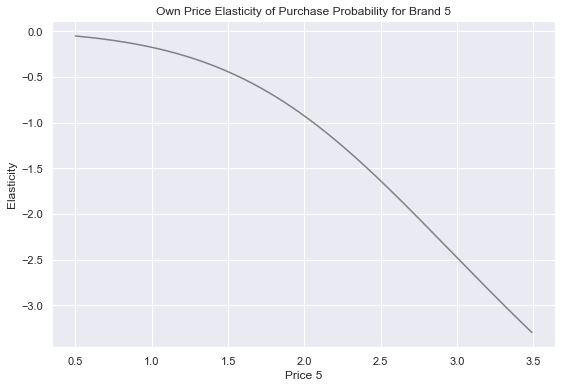

In [61]:
# Plot elasticities of purchase probability for brand 5.
plt.figure(figsize = (9, 6))
plt.plot(price_range, own_price_elasticity_brand_5, color = 'grey')
plt.xlabel('Price 5')
plt.ylabel('Elasticity')
plt.title('Own Price Elasticity of Purchase Probability for Brand 5')

The most important thing is how the purchase probobility is changing regarding the other brand.
The nearest brand is brand 4 so i'm going to calculate the Cross price elasticity respecting brand 4

## Cross Price Elasticity Brand 5, Cross Brand 4

##### We want to examine the effect of the changes in price of a competitor brand.
##### As we've discussed in the lecture, the brand which comes closest to our own brand is brand 4. Therefore, we need to examine changes in the price of this brand. 

#### The cross price elasticity formula is:
# E = -beta(own price) * price(cross brand) * Pr(cross brand)

The elasticity is equal to: negative own price coefficiency multiply price of the alternative brand multiple the probobility purchase of the atler brand.

In [62]:
# Creating the dataframe 
df_brand5_cross_brand4 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4['Price_1'] = brand_choice['Price_1'].mean()
df_brand5_cross_brand4['Price_2'] = brand_choice['Price_2'].mean()
df_brand5_cross_brand4['Price_3'] = brand_choice['Price_3'].mean()
df_brand5_cross_brand4['Price_4'] = price_range
df_brand5_cross_brand4['Price_5'] = brand_choice['Price_5'].mean()

In [63]:
df_brand5_cross_brand4.head()

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,0.50,2.654296
1,1.384559,1.764717,2.006694,0.51,2.654296
2,1.384559,1.764717,2.006694,0.52,2.654296
3,1.384559,1.764717,2.006694,0.53,2.654296
4,1.384559,1.764717,2.006694,0.54,2.654296


In [64]:
#calculating the probobility of brand 4
predict_brand5_cross_brand4 = model_brand_choice.predict_proba(df_brand5_cross_brand4)

In [65]:
# the probability of choosing the competitor brand is, 
# the purchase probability for brand 4, contained in the 4th column with index 3. 
pr_brand_4 = predict_brand5_cross_brand4[:][:, 3]

In [66]:
beta5

-1.09

### E = -beta(own price) * price(cross brand) * Pr(cross brand)

#### In order to calculate the cross brand price elasticity, we need to use the new formula we introduced in the lecture. The elasticity is equal to negative the price coefficient of the own brand multiplied by the price of the cross brand, further multiplied by the probability for choosing the cross brand.

In [67]:
# calculation
brand5_cross_brand4_price_elasticity = -beta5 * price_range * pr_brand_4

In [68]:
# Update price elasticities data frame to include the cross price elasticities for brand 5 with respect to brand 4.
df_price_elasticities['Brand_5_Cross_Brand_4'] = brand5_cross_brand4_price_elasticity
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion,Elasticity_without_Promotion,Brand_5,Brand_5_Cross_Brand_4
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728,-0.195639,-0.049055,0.332011
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844,-0.201759,-0.050616,0.337288
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039,-0.207983,-0.052207,0.342507
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313,-0.214309,-0.053827,0.347669
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669,-0.220740,-0.055477,0.352773
5,0.55,-0.119253,-0.193467,-0.041564,-0.244132,-0.140948,-0.147106,-0.227275,-0.057158,0.357820
6,0.56,-0.124054,-0.198752,-0.043852,-0.251268,-0.145612,-0.151627,-0.233916,-0.058871,0.362809
7,0.57,-0.129001,-0.204109,-0.046249,-0.258517,-0.150377,-0.156231,-0.240664,-0.060615,0.367741
8,0.58,-0.134098,-0.209540,-0.048761,-0.265881,-0.155244,-0.160920,-0.247519,-0.062391,0.372614
9,0.59,-0.139347,-0.215044,-0.051393,-0.273360,-0.160214,-0.165695,-0.254482,-0.064200,0.377430


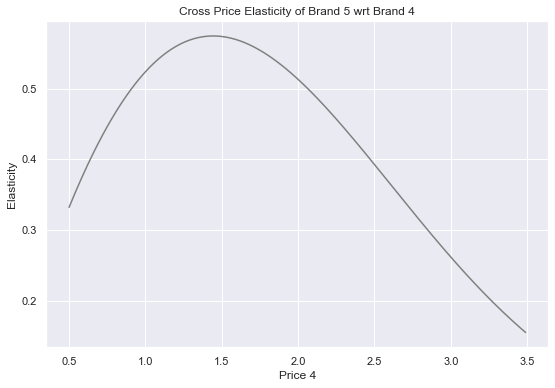

In [69]:
# Here we examine the cross price elasticity of purchase probability for brand 5 with respect to brand 4.
plt.figure(figsize = (9, 6))
plt.plot(price_range, brand5_cross_brand4_price_elasticity, color = 'grey')
plt.xlabel('Price 4')
plt.ylabel('Elasticity')
plt.title('Cross Price Elasticity of Brand 5 wrt Brand 4')
plt.show()

# Results:

#### Here we examine the cross price elasticity of purchase probability for brand 5 with respect to brand 4.

### IF the elasticity is greater than 0 we can say the brand are substitute 

#### We observe they are positive. As the price of the competitor brand increases, so does the probability for purchasing our own brand. Even though the elasticity starts to decrease from the 1.45 mark, it is still positive, signalling that the increase in purchase probability for the own brand happens more slowly.

### By understanding the plot we can say the brand 4 is bad substitute for brand 5, so it should find the way to sell its product to it own range of buyers.

Now its time to find the purchase probobility for brand 5 regarding to each segment

## Own and Cross-Price Elasticity by Segment

## I'm going to filter the data regarding each segment and calculate the elasticity of each for brand 5.

Well-Off

In [70]:
# getting the information related to WELL OFF segment
brand_choice_s3 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s3 = brand_choice_s3[brand_choice_s3['Segment'] == 3]
brand_choice_s3

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
376,200000005,51,1,5,1,0,0,1.35,1.87,1.93,...,49,1,121466,1,2,3,0,0,0,1
377,200000005,57,1,5,1,5,1,1.39,1.90,1.91,...,49,1,121466,1,2,3,0,0,0,1
394,200000005,159,1,5,2,0,0,1.39,1.90,1.94,...,49,1,121466,1,2,3,0,0,0,1
396,200000005,178,1,5,3,0,0,1.48,1.50,1.99,...,49,1,121466,1,2,3,0,0,0,1
410,200000005,249,1,5,1,0,0,1.46,1.89,1.99,...,49,1,121466,1,2,3,0,0,0,1
419,200000005,324,1,5,2,0,0,1.33,1.89,1.98,...,49,1,121466,1,2,3,0,0,0,1
424,200000005,352,1,5,1,0,0,1.23,1.81,1.97,...,49,1,121466,1,2,3,0,0,0,1
430,200000005,384,1,5,1,0,0,1.23,1.87,2.02,...,49,1,121466,1,2,3,0,0,0,1
446,200000005,505,1,5,2,0,0,1.21,1.89,2.07,...,49,1,121466,1,2,3,0,0,0,1
449,200000005,525,1,5,2,0,0,1.35,1.89,2.07,...,49,1,121466,1,2,3,0,0,0,1


In [71]:
# Brand Choice Model estimation.
Y = brand_choice_s3['Brand']
brand_choice_s3 = pd.get_dummies(brand_choice_s3, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s3[features]
model_brand_choice_s3 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s3.fit(X, Y)

# Coefficients table for it
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s3.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-2.38,1.13,1.39,-0.02,-0.11
Price_2,0.73,-1.65,0.05,0.40,0.47
Price_3,1.17,0.21,0.46,-1.71,-0.13
Price_4,0.03,0.65,0.41,-1.08,-0.01
Price_5,-0.00,-0.20,0.34,0.42,-0.55


### Own-Brand Price Elasticity

In [72]:
# Calculating own-brand price elasticity for brand 5 and the Well-off segment.
df_own_brand_5_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_own_brand_5_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_own_brand_5_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_own_brand_5_s3['Price_4'] = brand_choice_s3['Price_4'].mean()
df_own_brand_5_s3['Price_5'] = price_range

predict_own_brand_5_s3 = model_brand_choice_s3.predict_proba(df_own_brand_5_s3)
pr_own_brand_5_s3 = predict_own_brand_5_s3[: ][: , 4]

own_price_elasticity_brand_5_s3 =  beta5 * price_range * (1 - pr_own_brand_5_s3)
df_price_elasticities['Brand 5 S3'] = own_price_elasticity_brand_5_s3

### Cross-Brand Price Elasticity

In [73]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Well-off segment.
df_brand5_cross_brand4_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_brand5_cross_brand4_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_brand5_cross_brand4_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_brand5_cross_brand4_s3['Price_4'] = price_range
df_brand5_cross_brand4_s3['Price_5'] = brand_choice_s3['Price_5'].mean()

predict_brand5_cross_brand4_s3 = model_brand_choice_s3.predict_proba(df_brand5_cross_brand4_s3)
pr_cross_brand_5_s3 = predict_brand5_cross_brand4_s3[: ][: , 3]

# Update master data frame to include the newly obtained cross-brand price elasticities.
brand5_cross_brand4_price_elasticity_s3 = -beta5 * price_range * pr_cross_brand_5_s3
df_price_elasticities['Brand_5_Cross_Brand_4_S3'] = brand5_cross_brand4_price_elasticity_s3
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion,Elasticity_without_Promotion,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S3,Brand_5_Cross_Brand_4_S3
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728,-0.195639,-0.049055,0.332011,-0.043941,0.194769
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844,-0.201759,-0.050616,0.337288,-0.045028,0.197253
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039,-0.207983,-0.052207,0.342507,-0.046124,0.199686
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313,-0.214309,-0.053827,0.347669,-0.047229,0.202068
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669,-0.220740,-0.055477,0.352773,-0.048344,0.204400
5,0.55,-0.119253,-0.193467,-0.041564,-0.244132,-0.140948,-0.147106,-0.227275,-0.057158,0.357820,-0.049469,0.206682
6,0.56,-0.124054,-0.198752,-0.043852,-0.251268,-0.145612,-0.151627,-0.233916,-0.058871,0.362809,-0.050602,0.208915
7,0.57,-0.129001,-0.204109,-0.046249,-0.258517,-0.150377,-0.156231,-0.240664,-0.060615,0.367741,-0.051746,0.211098
8,0.58,-0.134098,-0.209540,-0.048761,-0.265881,-0.155244,-0.160920,-0.247519,-0.062391,0.372614,-0.052899,0.213232
9,0.59,-0.139347,-0.215044,-0.051393,-0.273360,-0.160214,-0.165695,-0.254482,-0.064200,0.377430,-0.054063,0.215318


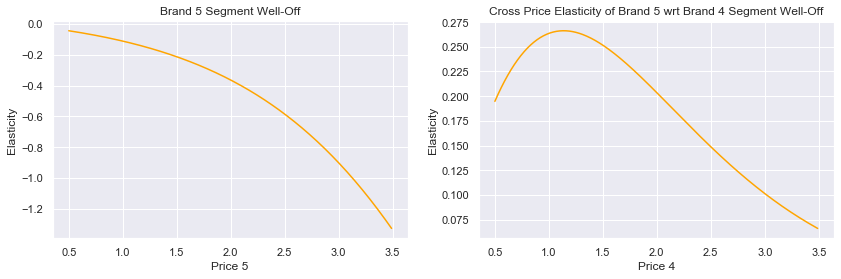

In [74]:
# Using a figure with axes we plot the own brand and cross-brand price elasticities for brand 5 cross brand 4 side by side.
fig, axs = plt.subplots(1, 2, figsize = (14, 4))
axs[0].plot(price_range, own_price_elasticity_brand_5_s3, color = 'orange')
axs[0].set_title('Brand 5 Segment Well-Off')
axs[0].set_xlabel('Price 5')

axs[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, color = 'orange')
axs[1].set_title('Cross Price Elasticity of Brand 5 wrt Brand 4 Segment Well-Off')
axs[1].set_xlabel('Price 4')

for ax in axs.flat:
    ax.set(ylabel = 'Elasticity')

### Standard
##### Analysing the brand choice probability of the Standard segment.

In [75]:
# filter our data, by selecting only purchases from segment 0.
brand_choice_s0 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s0 = brand_choice_s0[brand_choice_s0['Segment'] == 0]
brand_choice_s0.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
101,200000002,6,1,4,1,0,0,1.59,1.87,2.01,...,52,2,159052,2,1,0,1,0,0,0
115,200000002,100,1,4,2,0,0,1.47,1.90,1.95,...,52,2,159052,2,1,0,1,0,0,0
138,200000002,283,1,4,3,0,0,1.37,1.89,2.00,...,52,2,159052,2,1,0,1,0,0,0
141,200000002,307,1,4,1,0,0,1.34,1.89,2.01,...,52,2,159052,2,1,0,1,0,0,0
153,200000002,422,1,4,1,0,0,1.34,1.89,2.02,...,52,2,159052,2,1,0,1,0,0,0


In [76]:
# Brand Choice Model estimation.
Y = brand_choice_s0['Brand']
brand_choice_s0 = pd.get_dummies(brand_choice_s0, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s0[features]
model_brand_choice_s0 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 200)
model_brand_choice_s0.fit(X, Y)

# Coefficients table segment 0.
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s0.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

### Own-Brand Price Elasticity

In [77]:
# Calculating own-brand price elasticity for brand 5 and the Standard segment.
df_own_brand_5_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_own_brand_5_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_own_brand_5_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_own_brand_5_s0['Price_4'] = brand_choice_s0['Price_4'].mean()
df_own_brand_5_s0['Price_5'] = price_range

predict_own_brand_5_s0 = model_brand_choice_s0.predict_proba(df_own_brand_5_s0)
pr_own_brand_5_s0 = predict_own_brand_5_s0[: ][: , 4]

# Compute price elasticities and update master data frame.
# We'd like to include the elasticities for the segments in order from 0 to three, which is why we use insert() on position 10.
own_price_elasticity_brand_5_s0 =  beta5 * price_range * (1 - pr_own_brand_5_s0)
df_price_elasticities.insert(10, column = 'Brand 5 S0', value = own_price_elasticity_brand_5_s0)

### Cross-Brand Price Elasticity

In [78]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Standard segment.
df_brand5_cross_brand4_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_brand5_cross_brand4_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_brand5_cross_brand4_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_brand5_cross_brand4_s0['Price_4'] = price_range
df_brand5_cross_brand4_s0['Price_5'] = brand_choice_s0['Price_5'].mean()

predict_brand5_cross_brand4_s0 = model_brand_choice_s0.predict_proba(df_brand5_cross_brand4_s0)
pr_cross_brand_5_s0 = predict_brand5_cross_brand4_s0[: ][: , 3]

# Compute price elasticities and update master data frame.
# We need to use insert() on position 11, to save the price elasticities in the correct order.
brand5_cross_brand4_price_elasticity_s0 = -beta5 * price_range * pr_cross_brand_5_s0
df_price_elasticities.insert(11, column = 'Brand_5_Cross_Brand_4_S0', value = brand5_cross_brand4_price_elasticity_s0)

### Career-Focused

In [79]:
# Filter data by the Career-focused segment, which is the first segment.
brand_choice_s1 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s1 = brand_choice_s1[brand_choice_s1['Segment'] == 1]

In [80]:
# Brand Choice Model estimation.
Y = brand_choice_s1['Brand']
brand_choice_s1 = pd.get_dummies(brand_choice_s1, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s1[features]
model_brand_choice_s1 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s1.fit(X, Y)

# Coefficients table segment 1
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s1.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

### Own-Brand Price Elasticity

In [81]:
# Calculating own-brand price elasticity for brand 5 and the Career-focused segment.
df_own_brand_5_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_own_brand_5_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_own_brand_5_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_own_brand_5_s1['Price_4'] = brand_choice_s1['Price_4'].mean()
df_own_brand_5_s1['Price_5'] = price_range

predict_own_brand_5_s1 = model_brand_choice_s1.predict_proba(df_own_brand_5_s1)
pr_own_brand_5_s1 = predict_own_brand_5_s1[: ][: , 4]

#compute price elasticities and update data frame
own_price_elasticity_brand_5_s1 =  beta5 * price_range * (1 - pr_own_brand_5_s1)
df_price_elasticities.insert(12, column = 'Brand 5 S1', value = own_price_elasticity_brand_5_s1)

### Cross-Brand Price Elasticity

In [82]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Career-focused segment.
df_brand5_cross_brand4_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_brand5_cross_brand4_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_brand5_cross_brand4_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_brand5_cross_brand4_s1['Price_4'] = price_range
df_brand5_cross_brand4_s1['Price_5'] = brand_choice_s1['Price_5'].mean()

predict_brand5_cross_brand4_s1 = model_brand_choice_s1.predict_proba(df_brand5_cross_brand4_s1)
pr_cross_brand_5_s1 = predict_brand5_cross_brand4_s1[: ][: , 3]

brand5_cross_brand4_price_elasticity_s1 = -beta5 * price_range * pr_cross_brand_5_s1
df_price_elasticities.insert(13, column = 'Brand_5_Cross_Brand_4_S1', value = brand5_cross_brand4_price_elasticity_s1)

### Fewer-Opportunities

In [83]:
# Filter data, select only purchases from segment 2, which is the Fewer-Opportunities segment.
brand_choice_s2 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s2 = brand_choice_s2[brand_choice_s2['Segment'] == 2]

In [84]:
# Brand Choice Model estimation.
Y = brand_choice_s2['Brand']
brand_choice_s2 = pd.get_dummies(brand_choice_s2, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s2[features]
model_brand_choice_s2 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s2.fit(X, Y)

# Coefficients table segment 2
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s2.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

### Own-Brand Price Elasticity

In [85]:
# Calculating own-brand price elasticity for brand 5 and the Fewer-opportunities segment.
df_own_brand_5_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_own_brand_5_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_own_brand_5_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_own_brand_5_s2['Price_4'] = brand_choice_s2['Price_4'].mean()
df_own_brand_5_s2['Price_5'] = price_range

predict_own_brand_5_s2 = model_brand_choice_s2.predict_proba(df_own_brand_5_s2)
pr_own_brand_5_s2 = predict_own_brand_5_s2[: ][: , 4]

#compute price elasticities and update data frame
own_price_elasticity_brand_5_s2 =  beta5 * price_range * (1 - pr_own_brand_5_s2)
df_price_elasticities.insert(14, column = 'Brand 5 S2', value = own_price_elasticity_brand_5_s2)

### Cross-Brand Price Elasticity

In [86]:
# Calculating cross-brand price elasticity for brand 5 with respect to brand 4 for the Fewer-opportunities segment.
df_brand5_cross_brand4_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_brand5_cross_brand4_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_brand5_cross_brand4_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_brand5_cross_brand4_s2['Price_4'] = price_range
df_brand5_cross_brand4_s2['Price_5'] = brand_choice_s2['Price_5'].mean()

predict_brand5_cross_brand4_s2 = model_brand_choice_s2.predict_proba(df_brand5_cross_brand4_s2)
pr_cross_brand_5_s2 = predict_brand5_cross_brand4_s2[: ][: , 3]

brand5_cross_brand4_price_elasticity_s2 = -beta5 * price_range * pr_cross_brand_5_s2
df_price_elasticities.insert(15, column = 'Brand_5_Cross_Brand_4_S2', value = brand5_cross_brand4_price_elasticity_s2)
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion,Elasticity_without_Promotion,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728,-0.195639,-0.049055,0.332011,-0.297632,0.482432,-0.001034,0.187008,-0.116275,0.160456,-0.043941,0.194769
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844,-0.201759,-0.050616,0.337288,-0.303681,0.491737,-0.001096,0.189371,-0.119323,0.162406,-0.045028,0.197253
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039,-0.207983,-0.052207,0.342507,-0.309740,0.501027,-0.001161,0.191683,-0.122406,0.164310,-0.046124,0.199686
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313,-0.214309,-0.053827,0.347669,-0.315810,0.510301,-0.001229,0.193944,-0.125525,0.166170,-0.047229,0.202068
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669,-0.220740,-0.055477,0.352773,-0.321890,0.519559,-0.001300,0.196156,-0.128679,0.167985,-0.048344,0.204400
5,0.55,-0.119253,-0.193467,-0.041564,-0.244132,-0.140948,-0.147106,-0.227275,-0.057158,0.357820,-0.327982,0.528801,-0.001376,0.198317,-0.131869,0.169756,-0.049469,0.206682
6,0.56,-0.124054,-0.198752,-0.043852,-0.251268,-0.145612,-0.151627,-0.233916,-0.058871,0.362809,-0.334086,0.538027,-0.001455,0.200428,-0.135096,0.171483,-0.050602,0.208915
7,0.57,-0.129001,-0.204109,-0.046249,-0.258517,-0.150377,-0.156231,-0.240664,-0.060615,0.367741,-0.340202,0.547237,-0.001538,0.202490,-0.138360,0.173166,-0.051746,0.211098
8,0.58,-0.134098,-0.209540,-0.048761,-0.265881,-0.155244,-0.160920,-0.247519,-0.062391,0.372614,-0.346331,0.556431,-0.001626,0.204503,-0.141662,0.174806,-0.052899,0.213232
9,0.59,-0.139347,-0.215044,-0.051393,-0.273360,-0.160214,-0.165695,-0.254482,-0.064200,0.377430,-0.352472,0.565608,-0.001718,0.206466,-0.145001,0.176403,-0.054063,0.215318


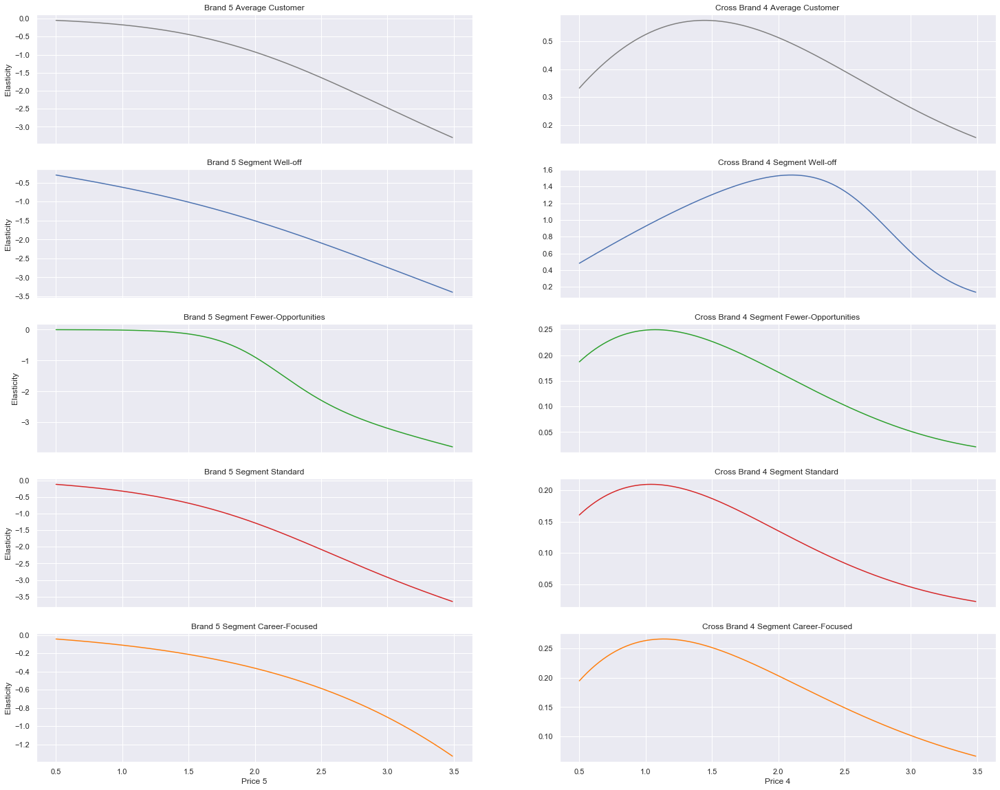

In [87]:
# now lets plot all the result to compair
fig1, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 2, figsize = (25, 20), sharex = True)
ax1[0].plot(price_range, own_price_elasticity_brand_5, 'tab:grey')
ax1[0].set_title('Brand 5 Average Customer')
ax1[0].set_ylabel('Elasticity')
ax1[1].plot(price_range, brand5_cross_brand4_price_elasticity, 'tab:grey')
ax1[1].set_title('Cross Brand 4 Average Customer')


ax2[0].plot(price_range, own_price_elasticity_brand_5_s0)
ax2[0].set_title('Brand 5 Segment Well-off')
ax2[0].set_ylabel('Elasticity')
ax2[1].plot(price_range, brand5_cross_brand4_price_elasticity_s0)
ax2[1].set_title('Cross Brand 4 Segment Well-off')

ax3[0].plot(price_range, own_price_elasticity_brand_5_s1, 'tab:green')
ax3[0].set_title('Brand 5 Segment Fewer-Opportunities')
ax3[0].set_ylabel('Elasticity')
ax3[1].plot(price_range, brand5_cross_brand4_price_elasticity_s1, 'tab:green')
ax3[1].set_title('Cross Brand 4 Segment Fewer-Opportunities')

ax4[0].plot(price_range, own_price_elasticity_brand_5_s2, 'tab:red')
ax4[0].set_title('Brand 5 Segment Standard')
ax4[0].set_ylabel('Elasticity')
ax4[1].plot(price_range, brand5_cross_brand4_price_elasticity_s2, 'tab:red')
ax4[1].set_title('Cross Brand 4 Segment Standard ')

ax5[0].plot(price_range, own_price_elasticity_brand_5_s3, 'tab:orange')
ax5[0].set_title('Brand 5 Segment Career-Focused')
ax5[0].set_xlabel('Price 5')
ax5[0].set_ylabel('Elasticity')
ax5[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, 'tab:orange')
ax5[1].set_title('Cross Brand 4 Segment Career-Focused')
ax5[1].set_xlabel('Price 4')

plt.show()

# Result
### We plot the own and cross brand price elasticities for the average customer and each of the four segments.

### Lets see each segment:

### Standard:
##### regarding to graph, this segment has the elasticity to brand one, therfore we should lower the price to increase the purchase probobility, so this segment might not be our interest


### Carrier-Focused:
##### This segment seems to inelastic to our brand, that means increasing the price wont affect purchase probobility, in other hand the cross brand elasticity shows  exteremly low values, and that means they are unlike to buy compatetive brand ( they are loyal)


### Fewer-Opportunities:
##### Customers from this segment seems to inelastic in the low price but by in the high price values they became most elastic ones, and regarding to cross brand elasticity they are in the same range of  Carrier-Focused (We don't have enough data to find the reason of having the same curves shape but we can assume the product is too pricy) this group 100% wont be our target.


### Well-Off: 
##### The shape of the curves for this segment shows that they are more elastic againts carrier-focused therefore increasing price will change the purchase robobility of carrier-focused but will hardly damage our well-off segment.


#### The observation shows differences and similiraties between the segments and examine their preference, when it comes to brand choice. The two segments, which seem to be of most interested for the marketing team of brand 5, seem to be the Career-focused and the Well-off. They are also the segments which purchase this brand most often. 

#### The Career-focused segment is the most inelastic and they are the most loyal segment. Based on our model, they do not seem to be that affected by price, therefore brand 5 could increase its price, without fear of significant loss of customers from this segment.

#### The Well-off segment on the other hand, seems to be more elastic. They also purchase the competitor brand 4 most often. In order to target this segment, our analysis signals, that price needs to be decreased. However, other factors aside from price might be influencing the purchase behaivour of this segment.

# Recommendation:
##### If we decrease the price a little bit, we can have our Loyal customers and share the well-off segment with brand 4





we can check and calculate the Own and cross brand elasticity by the same method for all other brands

# The last Marketing MIX question is HOW MANY ITEM THE CUSTOMER IS GOING TO BUY?

##### All prediction is numeric so we can use LINEAR REGRESSION model to predict.

##### I want to determine price elasticity of purchase quantity, also known as price elasticity of demand. Being interested in purchase ocassion, where the purchased quantity is different from 0.Therefore, once again we filter our data to contain only shopping visits where the client has purchased at least one product.

## Price Elasticity of Purchase Quantity

In [88]:
#making a new dataframe
df_purchase_quantity = df_pa[df_pa['Incidence'] == 1]
df_purchase_quantity.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,1,0,1,0,0
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,1,0,1,0,0
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,1,0,1,0,0
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,1,0,1,0,0
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,1,0,1,0,0


#### The descriptive analysis of the purchase quantitiy data frame, shows that quantity ranges from 1 to 15 and has an average value of 2.8, which means that more often than not our customers buy more than 1 product.

In [89]:
# Create brand dummies, for each of the five brands.
df_purchase_quantity = pd.get_dummies(df_purchase_quantity, columns = ['Brand'], prefix = 'Brand', prefix_sep = '_')
df_purchase_quantity

,ID,Day,Incidence,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,...,Segment,Segment_0,Segment_1,Segment_2,Segment_3,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
6,200000001,28,1,2,0,0,1.50,1.90,1.99,2.09,...,1,0,1,0,0,0,1,0,0,0
11,200000001,58,1,1,0,0,1.39,1.90,1.91,2.12,...,1,0,1,0,0,0,0,0,0,1
19,200000001,110,1,2,0,0,1.47,1.90,1.99,1.97,...,1,0,1,0,0,1,0,0,0,0
24,200000001,142,1,1,0,0,1.21,1.35,1.99,2.16,...,1,0,1,0,0,0,0,0,1,0
29,200000001,183,1,3,0,0,1.46,1.88,1.97,1.89,...,1,0,1,0,0,0,1,0,0,0
52,200000001,327,1,3,0,0,1.47,1.89,2.01,1.90,...,1,0,1,0,0,0,0,0,1,0
79,200000001,547,1,2,0,0,1.35,1.89,2.07,2.26,...,1,0,1,0,0,0,1,0,0,0
80,200000001,562,1,3,2,1,1.33,1.51,2.07,2.26,...,1,0,1,0,0,0,1,0,0,0
97,200000001,702,1,1,0,0,1.41,1.85,2.00,2.24,...,1,0,1,0,0,0,0,0,0,1
101,200000002,6,1,1,0,0,1.59,1.87,2.01,2.09,...,0,1,0,0,0,0,0,0,1,0


In [90]:
df_purchase_quantity.describe()

,ID,Day,Incidence,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,...,Segment,Segment_0,Segment_1,Segment_2,Segment_3,Brand_1,Brand_2,Brand_3,Brand_4,Brand_5
count,1.463800e+04,14638.000000,14638.0,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,...,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000
mean,2.000003e+08,359.607597,1.0,2.774559,1.535251,0.406955,1.384559,1.764717,2.006694,2.159658,...,1.543244,0.231657,0.292731,0.176322,0.299290,0.092226,0.310288,0.057453,0.199959,0.340074
std,1.423786e+02,205.346253,0.0,1.796736,2.060858,0.491283,0.090944,0.181667,0.046200,0.093253,...,1.144602,0.421906,0.455032,0.381107,0.457962,0.289354,0.462627,0.232714,0.399983,0.473750
min,2.000000e+08,1.000000,1.0,1.000000,0.000000,0.000000,1.100000,1.260000,1.870000,1.760000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000001e+08,175.000000,1.0,2.000000,0.000000,0.000000,1.340000,1.570000,1.970000,2.120000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000003e+08,355.000000,1.0,2.000000,0.000000,0.000000,1.390000,1.880000,2.010000,2.180000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.000004e+08,532.000000,1.0,3.000000,4.000000,1.000000,1.470000,1.890000,2.060000,2.240000,...,3.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000
max,2.000005e+08,727.000000,1.0,15.000000,5.000000,1.000000,1.590000,1.900000,2.140000,2.260000,...,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


We can see the Minimum Quantity is 1 (we exclude the none purchasing) and the maximum is 15 for each product,

#### Lets witch features have an impact on our target

In [91]:
#make a decission on which features to include in the model.
df_purchase_quantity.columns.values

array(['ID', 'Day', 'Incidence', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3', 'Brand_1',
       'Brand_2', 'Brand_3', 'Brand_4', 'Brand_5'], dtype=object)

In this time the customer knows which brand to buy, so the important thing is to compair the price of brands, for that we have to make a feature 

In [92]:
#Find the price of the product that is chosen at this incidence
df_purchase_quantity['Price_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Price_1'] +
                                           df_purchase_quantity['Brand_2'] * df_purchase_quantity['Price_2'] +
                                           df_purchase_quantity['Brand_3'] * df_purchase_quantity['Price_3'] +
                                           df_purchase_quantity['Brand_4'] * df_purchase_quantity['Price_4'] +
                                           df_purchase_quantity['Brand_5'] * df_purchase_quantity['Price_5'] )

In [93]:
#Find the price of the product that is chosen at this incidence
df_purchase_quantity['Promotion_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Promotion_1'] +
                                               df_purchase_quantity['Brand_2'] * df_purchase_quantity['Promotion_2'] +
                                               df_purchase_quantity['Brand_3'] * df_purchase_quantity['Promotion_3'] +
                                               df_purchase_quantity['Brand_4'] * df_purchase_quantity['Promotion_4'] +
                                               df_purchase_quantity['Brand_5'] * df_purchase_quantity['Promotion_5'] )

## Model Estimation. Linear Regression

In [94]:
X = df_purchase_quantity[['Price_Incidence', 'Promotion_Incidence']]
pd.options.display.max_rows = 100
X

,Price_Incidence,Promotion_Incidence
6,1.90,0
11,2.62,1
19,1.47,0
24,2.16,0
29,1.88,0
...,...,...
58621,1.89,0
58648,1.35,1
58674,1.85,1
58687,1.51,0


In [95]:
Y = df_purchase_quantity['Quantity']
Y.head()

6     2
11    1
19    2
24    1
29    3
Name: Quantity, dtype: int64

In [96]:
# Linear Regression Model
model_quantity = LinearRegression()
model_quantity.fit(X, Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

#### Linear Regression Model. The coefficients for price and promotion are both negative. It appears that promotion reflects negatively on the purchase quantity of the average client, which is unexpected.

In [97]:
# model coef
model_quantity.coef_

array([-0.8173651 , -0.10504673])

# Result interpretations:
#### For each 1$ increasing the price -0.81 product will be boughten, and if there is a promotion -0.10 product will be boughten.

#### Lets check the price elasticities for price with and without promotions

## Price Elasticity with Promotion

In [99]:
# examine the price elasticity of purchase quantity with active promotional activities for each price point.
df_price_elasticity_quantity = pd.DataFrame(index = np.arange(price_range.size))
df_price_elasticity_quantity['Price_Incidence'] = price_range
df_price_elasticity_quantity['Promotion_Incidence'] = 1

In [100]:
#Take the coefficient for price.
beta_quantity = model_quantity.coef_[0]
beta_quantity

-0.8173651016684998

In [101]:
predict_quantity = model_quantity.predict(df_price_elasticity_quantity)

#### calculate the price elasticity with our new formula. It is the beta coefficient for price multiplied by price and divided by the purchase quantity.

In [102]:
price_elasticity_quantity_promotion_yes = beta_quantity * price_range / predict_quantity

In [103]:
df_price_elasticities['PE_Quantity_Promotion_1'] = price_elasticity_quantity_promotion_yes
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion,Elasticity_without_Promotion,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3,PE_Quantity_Promotion_1
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728,-0.195639,-0.049055,0.332011,-0.297632,0.482432,-0.001034,0.187008,-0.116275,0.160456,-0.043941,0.194769,-0.102157
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844,-0.201759,-0.050616,0.337288,-0.303681,0.491737,-0.001096,0.189371,-0.119323,0.162406,-0.045028,0.197253,-0.104413
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039,-0.207983,-0.052207,0.342507,-0.309740,0.501027,-0.001161,0.191683,-0.122406,0.164310,-0.046124,0.199686,-0.106679
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313,-0.214309,-0.053827,0.347669,-0.315810,0.510301,-0.001229,0.193944,-0.125525,0.166170,-0.047229,0.202068,-0.108954
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669,-0.220740,-0.055477,0.352773,-0.321890,0.519559,-0.001300,0.196156,-0.128679,0.167985,-0.048344,0.204400,-0.111238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.072953,-4.024243,-12.516559,-5.113265,-5.680113,-4.860850,-4.982501,-3.231573,0.162234,-3.336897,0.157728,-3.746031,0.022977,-3.592243,0.024309,-1.287425,0.068593,-1.774292
296,3.46,-8.098305,-4.039114,-12.553399,-5.130290,-5.700269,-4.879050,-4.999406,-3.247767,0.160333,-3.350222,0.152302,-3.757475,0.022524,-3.606124,0.023948,-1.297234,0.067970,-1.788634
297,3.47,-8.123624,-4.053970,-12.590222,-5.147297,-5.720387,-4.897220,-5.016290,-3.263929,0.158448,-3.363544,0.147041,-3.768899,0.022078,-3.619962,0.023591,-1.307098,0.067352,-1.803124
298,3.48,-8.148909,-4.068809,-12.627029,-5.164285,-5.740470,-4.915359,-5.033155,-3.280058,0.156576,-3.376862,0.141942,-3.780303,0.021639,-3.633756,0.023239,-1.317017,0.066737,-1.817766


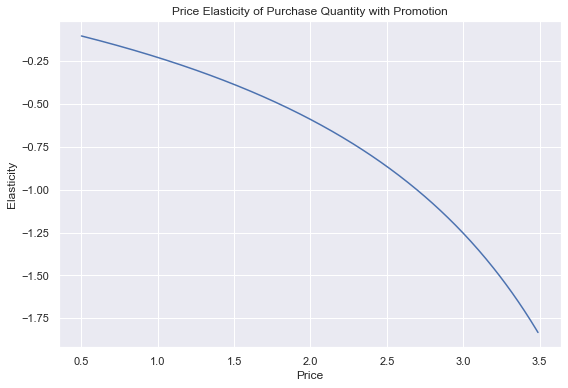

In [104]:
#Ploting the both results 
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')
plt.show()

#### Overwrite promotion incidence in order to use the same df. Here we assume there are no promotinal activities active for the entire price range.

## Price Elasticity without Promotion

In [105]:
# the feature equal to 0 for no promotions
df_price_elasticity_quantity['Promotion_Incidence'] = 0
# Find the new predicted quantities.
predict_quantity = model_quantity.predict(df_price_elasticity_quantity)
# Calculate the new price elasticities.
price_elasticity_quantity_promotion_no = beta_quantity * price_range / predict_quantity
# Add the results to the master data frame.
df_price_elasticities['PE_Quantity_Promotion_0'] = price_elasticity_quantity_promotion_no
df_price_elasticities

,Price_Point,Mean_PE,Standard,Carrier-Focused,Fewer-Opportunities,Well-Off,Elasticity_with_Promotion,Elasticity_without_Promotion,Brand_5,Brand_5_Cross_Brand_4,Brand 5 S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand 5 S3,Brand_5_Cross_Brand_4_S3,PE_Quantity_Promotion_1,PE_Quantity_Promotion_0
0,0.50,-0.097319,-0.168120,-0.031619,-0.210131,-0.119087,-0.125728,-0.195639,-0.049055,0.332011,-0.297632,0.482432,-0.001034,0.187008,-0.116275,0.160456,-0.043941,0.194769,-0.102157,-0.099543
1,0.51,-0.101441,-0.173048,-0.033423,-0.216710,-0.123270,-0.129844,-0.201759,-0.050616,0.337288,-0.303681,0.491737,-0.001096,0.189371,-0.119323,0.162406,-0.045028,0.197253,-0.104413,-0.101736
2,0.52,-0.105691,-0.178046,-0.035315,-0.223399,-0.127546,-0.134039,-0.207983,-0.052207,0.342507,-0.309740,0.501027,-0.001161,0.191683,-0.122406,0.164310,-0.046124,0.199686,-0.106679,-0.103939
3,0.53,-0.110075,-0.183115,-0.037300,-0.230199,-0.131916,-0.138313,-0.214309,-0.053827,0.347669,-0.315810,0.510301,-0.001229,0.193944,-0.125525,0.166170,-0.047229,0.202068,-0.108954,-0.106150
4,0.54,-0.114594,-0.188255,-0.039382,-0.237109,-0.136383,-0.142669,-0.220740,-0.055477,0.352773,-0.321890,0.519559,-0.001300,0.196156,-0.128679,0.167985,-0.048344,0.204400,-0.111238,-0.108369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.072953,-4.024243,-12.516559,-5.113265,-5.680113,-4.860850,-4.982501,-3.231573,0.162234,-3.336897,0.157728,-3.746031,0.022977,-3.592243,0.024309,-1.287425,0.068593,-1.774292,-1.664290
296,3.46,-8.098305,-4.039114,-12.553399,-5.130290,-5.700269,-4.879050,-4.999406,-3.247767,0.160333,-3.350222,0.152302,-3.757475,0.022524,-3.606124,0.023948,-1.297234,0.067970,-1.788634,-1.677205
297,3.47,-8.123624,-4.053970,-12.590222,-5.147297,-5.720387,-4.897220,-5.016290,-3.263929,0.158448,-3.363544,0.147041,-3.768899,0.022078,-3.619962,0.023591,-1.307098,0.067352,-1.803124,-1.690246
298,3.48,-8.148909,-4.068809,-12.627029,-5.164285,-5.740470,-4.915359,-5.033155,-3.280058,0.156576,-3.376862,0.141942,-3.780303,0.021639,-3.633756,0.023239,-1.317017,0.066737,-1.817766,-1.703414


##### Lets plot the two elasticities side by side. 

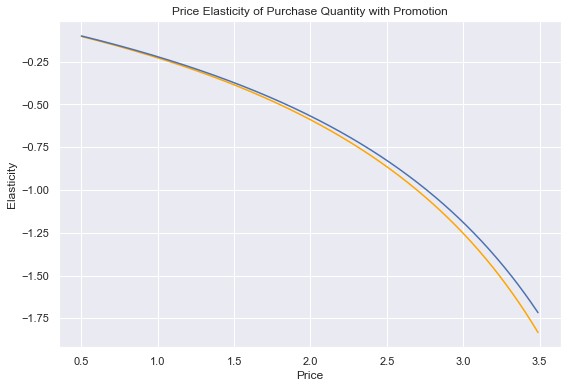

In [108]:
# ploting both results
plt.figure(figsize = (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes, color = 'orange')
plt.plot(price_range, price_elasticity_quantity_promotion_no)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')
plt.show()

#### We observe that the two elasticities are very close together for almost the entire price range.
#### It appears that promotion does not appear to be a significant factor in the customers Decisions what quantity of product to purchase.